# HelloFresh - Predicting Review Sentiment

## Context

HelloFresh is a meal kit delivery service that aims to make it easier for people to cook meals at home. The company provides customers with the ingredients and recipes needed to prepare meals, which are delivered to their doorstep in a refrigerated box.

HelloFresh aims to improve customer satisfaction through constant evaluation of customer feedback and reviews. 

In this project, we will obtain reviews from the web and classify them into positive and negative reviews, using natural language processing techniques and machine learning models.


In [2]:
import re
import time
import requests
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
import plotly.graph_objects as go
from bs4 import BeautifulSoup
import textblob

import spacy
from spacy.lang.en.stop_words import STOP_WORDS

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    average_precision_score,
    roc_auc_score,
    precision_recall_curve,
    roc_curve,
    auc,
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
)

In [3]:
nlp = spacy.load('en_core_web_md')

## Collect Data

The reviews are scraped from trustpilot - https://nz.trustpilot.com/review/hellofresh.co.nz

In [38]:
%%time

title_list = []
body_list = []
rating_list = []
date_list = []

# scrape reviews page by page
# should ideally check if the 'next page' element exists, then use a while loop
# for page in range(1,101):
for page in range(1,300):
    
    time.sleep(2)
    print(page, end=", ")
    url = f'https://nz.trustpilot.com/review/hellofresh.co.nz?page={page}'
    http = requests.get(url)
    bsoup = BeautifulSoup(http.text, 'html.parser')
    
    cards = bsoup.find_all('div', class_='styles_cardWrapper__LcCPA styles_show__HUXRb styles_reviewCard__9HxJJ')

#     if cards:
#         print(True)
        
    for card in cards:
        title = card.find('h2', class_="typography_heading-s__f7029 typography_appearance-default__AAY17").text
        rating = card.find('div', class_='styles_reviewHeader__iU9Px')
        
        review = card.find('p', class_='typography_body-l__KUYFJ typography_appearance-default__AAY17 typography_color-black__5LYEn')
        review_body = review.text if review else np.nan
        
        review_date = card.find('time')

        title_list.append(title)
        body_list.append(review_body)
        rating_list.append(rating.get('data-service-review-rating'))
        date_list.append(review_date['datetime'])
        


1, True
2, True
3, True
4, True
5, True
6, True
7, True
8, True
9, True
10, True
11, True
12, True
13, True
14, True
15, True
16, True
17, True
18, True
19, True
20, True
21, True
22, True
23, True
24, True
25, True
26, True
27, True
28, True
29, True
30, True
31, True
32, True
33, True
34, True
35, True
36, True
37, True
38, True
39, True
40, True
41, True
42, True
43, True
44, True
45, True
46, True
47, True
48, True
49, True
50, True
51, True
52, True
53, True
54, True
55, True
56, True
57, True
58, True
59, True
60, True
61, True
62, True
63, True
64, True
65, True
66, True
67, True
68, True
69, True
70, True
71, True
72, True
73, True
74, True
75, True
76, True
77, True
78, True
79, True
80, True
81, True
82, True
83, True
84, True
85, True
86, True
87, True
88, True
89, True
90, True
91, True
92, True
93, True
94, True
95, True
96, True
97, True
98, True
99, True
100, True
CPU times: user 14 s, sys: 441 ms, total: 14.5 s
Wall time: 5min 35s


In [10]:
# Convert the lists into dataframe

df = pd.DataFrame({'title': title_list, 'body': body_list, 'date':date_list, 'rating': rating_list})

In [248]:
df.head()

,title,body,date,rating
0,Easy and convenient,I love the convenience of being able to order ...,2023-01-02 03:38:39+00:00,4
1,You can't skip 6 or more weeks,You can't skip 6 or more weeks. It has to be e...,2023-01-02 09:12:14+00:00,2
2,During the start of Covid I started to…hunker ...,During the start of Covid I started to order H...,2023-01-02 05:09:48+00:00,5
3,Soggy package when delivered,Package received was wet at the bottom of the ...,2022-12-31 09:45:46+00:00,1
4,Continues to dissapoint,Hello fresh has gotten increasingly disappoint...,2022-12-31 02:12:55+00:00,1


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5820 entries, 0 to 5819
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   title   5820 non-null   object
 1   body    5476 non-null   object
 2   date    5820 non-null   object
 3   rating  5820 non-null   object
dtypes: object(4)
memory usage: 182.0+ KB


All are object type. Note there are null values in 'body' as some reviews only have a title.

In [131]:
# Convert date to datetime, rating to integer

df['date'] = pd.to_datetime(df['date'])
df['rating'] = pd.to_numeric(df['rating'])

Combine title and body into a new feature **review**, since title can give additional information.

In [132]:
df['review'] = df['title'] + ' ' + df['body']

All reviews have a title, so for reviews with null body, I will use the title.

In [17]:
df['body'].isna().sum()

344

In [18]:
df[df['body'].isna()]

,title,body,date,rating,review
81,Love the recipes makes cooking fun.,NaN,2023-01-01 23:07:22+00:00,4,NaN
154,We chose really lovely meals,NaN,2022-12-20 21:12:57+00:00,5,NaN
155,Fresh products delivered on time,NaN,2022-12-18 10:16:42+00:00,4,NaN
159,Good quick & easy meals,NaN,2022-12-21 09:48:33+00:00,4,NaN
161,Great service,NaN,2022-12-24 11:36:08+00:00,5,NaN
...,...,...,...,...,...
5714,very happy with the Hello fresh meals,NaN,2021-07-30 10:34:16+00:00,4,NaN
5767,excellent products and recipies,NaN,2021-07-25 19:58:56+00:00,5,NaN
5777,Extremely tummy tasty and healthy food!,NaN,2021-07-25 01:12:33+00:00,5,NaN
5784,Very yummy receipes this week.,NaN,2021-07-23 21:10:08+00:00,5,NaN


In [133]:
df['review'].fillna(df['title'], inplace=True)

## Pre-processing

In this section, each review will be pre-processed with the following steps.

- Lower case
- Add space after special characters, except apostrophe
- Remove numbers
- Filter out stop words and non-alphabetic characters
- Lemmatise

In [22]:
def preprocess_text(text):
    
    # lowercase
    text = text.lower()
    
    # add space after special characters excluding '’ for contraction - note the different apostrophes??
    # some have no space after full stop e.g. excellent.Good service 
    # this ensures the words are separated
    text = re.sub(r'[^a-zA-Z0-9\s\'’]', ' ', text)
    
    # remove numbers
    text = re.sub(r'[0-9]', '', text)
    
    # lemmatized tokens - filter out stop words and non-alphabetic
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc if not token.is_stop and token.is_alpha]
    
    # return as single string
    return ' '.join(tokens)

In [134]:
# Apply preprocessing to reviews

df['review_clean'] = df['review'].apply(preprocess_text)

In [24]:
# check data

df.head()

,title,body,date,rating,review,review_clean
0,Easy and convenient,I love the convenience of being able to order ...,2023-01-02 03:38:39+00:00,4,Easy and convenient I love the convenience of ...,easy convenient love convenience able order ah...
1,You can't skip 6 or more weeks,You can't skip 6 or more weeks. It has to be e...,2023-01-02 09:12:14+00:00,2,You can't skip 6 or more weeks You can't skip ...,skip week skip week easy click associated page...
2,During the start of Covid I started to…hunker ...,During the start of Covid I started to order H...,2023-01-02 05:09:48+00:00,5,During the start of Covid I started to…hunker ...,start covid start hunker want start covid star...
3,Soggy package when delivered,Package received was wet at the bottom of the ...,2022-12-31 09:45:46+00:00,1,Soggy package when delivered Package received ...,soggy package deliver package receive wet box ...
4,Continues to dissapoint,Hello fresh has gotten increasingly disappoint...,2022-12-31 02:12:55+00:00,1,Continues to dissapoint Hello fresh has gotten...,continue dissapoint hello fresh get increasing...


Also create new numeric features to be used for EDA.

- Word count
- Character count
- Word density - average number of characters per word
- Number of uppercase characters
- Polarity (Range between -1 to 1)

In [26]:
# count the number of uppercase characters from review

def count_uppercase(text):
    return len(re.findall(r'[A-Z]', text))

In [27]:
# compute polarity of review using textblob 
# Negative sentiment = -1, positive sentiment = 1

def get_polarity(review):
    review_blob = textblob.TextBlob(review)
    return review_blob.sentiment.polarity

In [135]:
df['word_count'] = df['review'].apply(lambda x: len(x.split(" ")))

In [136]:
df['char_count'] = df['review'].apply(lambda x: sum(len(word) for word in str(x).split(" ")))

In [137]:
df['word_density'] = round(df['char_count'] / df['word_count'])

In [138]:
df['uppercase_count'] = df['review'].apply(count_uppercase)

In [139]:
df['polarity'] = df['review'].apply(get_polarity)

In [140]:
df.head()

,title,body,date,rating,review,review_clean,word_count,char_count,word_density,uppercase_count,polarity
0,Easy and convenient,I love the convenience of being able to order ...,2023-01-02 03:38:39+00:00,4,Easy and convenient I love the convenience of ...,easy convenient love convenience able order ah...,79,347,4.0,8,0.378030
1,You can't skip 6 or more weeks,You can't skip 6 or more weeks. It has to be e...,2023-01-02 09:12:14+00:00,2,You can't skip 6 or more weeks You can't skip ...,skip week skip week easy click associated page...,88,355,4.0,13,0.200000
2,During the start of Covid I started to…hunker ...,During the start of Covid I started to order H...,2023-01-02 05:09:48+00:00,5,During the start of Covid I started to…hunker ...,start covid start hunker want start covid star...,84,347,4.0,17,0.438272
3,Soggy package when delivered,Package received was wet at the bottom of the ...,2022-12-31 09:45:46+00:00,1,Soggy package when delivered Package received ...,soggy package deliver package receive wet box ...,49,269,5.0,5,-0.150000
4,Continues to dissapoint,Hello fresh has gotten increasingly disappoint...,2022-12-31 02:12:55+00:00,1,Continues to dissapoint Hello fresh has gotten...,continue dissapoint hello fresh get increasing...,49,236,5.0,5,-0.025000


## Exploratory Data Analysis

In [34]:
df.describe()

,rating,word_count,char_count,word_density,uppercase_count,polarity
count,5820.000000,5820.000000,5820.000000,5820.000000,5820.000000,5820.000000
mean,4.186598,45.335395,200.407045,4.565979,5.799485,0.335474
std,1.035489,42.720860,183.793867,0.736646,6.448269,0.252814
min,1.000000,1.000000,10.000000,3.000000,0.000000,-1.000000
25%,4.000000,20.000000,91.000000,4.000000,3.000000,0.191667
50%,4.000000,35.000000,154.000000,4.000000,4.000000,0.350000
75%,5.000000,58.000000,255.000000,5.000000,7.000000,0.497693
max,5.000000,761.000000,3201.000000,11.000000,143.000000,1.000000


- Median **rating** is 4. Overall there are more positive reviews.
- Average **word count** is 45.3 with standard deviation of 42.7. Maximum word count is 761, indicates there is high spread.
- Similar trend observed for **character count**, with average 200 and std 183.8. Maximum count is 3201.
- There are on average 4.6 characters in each word. Ranges from 3~11 characters per word.
- Average **uppercase_count** is 5.8 and standard deviation of 6.4. Maximum count is 143 - there could be reviews written mostly in uppercase.
- Average **polarity** is 0.34. Generally positive sentiment. Ranges from -1 to 1.

In [250]:
# check number of reviews per rating

df['rating'].value_counts().sort_index()

1     236
2     190
3     692
4    1836
5    2866
Name: rating, dtype: int64

In [142]:
# percentage of reviews per rating

df['rating'].value_counts(normalize=True).sort_index()*100

1     4.054983
2     3.264605
3    11.890034
4    31.546392
5    49.243986
Name: rating, dtype: float64

In [143]:
rating_counts = df['rating'].value_counts(normalize=True)*100
fig = px.bar(y=rating_counts, x=rating_counts.index, title='Percentage of reviews per rating', text=rating_counts.round())
fig.show()


It is obvious there is class imbalance for the negative reviews. 
- Majority (81%) are positive reviews that have rating 4 or 5
- Almost half of all reviews are rated 5.  
- Negative reviews (rated 1 or 2) make up just 7% of total reviews.

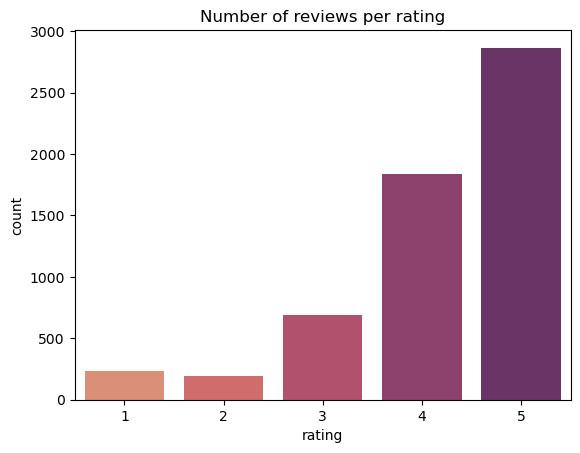

In [43]:
_= sns.countplot(data=df, x='rating', palette='flare').set_title('Number of reviews per rating')

Look at each numerical feature by rating and see if there are differences.

In [44]:
df.groupby('rating').mean().round(2)

,word_count,char_count,word_density,uppercase_count,polarity
rating,,,,,
1,85.12,377.40,4.53,10.56,-0.04
2,69.13,307.40,4.56,8.21,0.01
3,58.64,256.66,4.48,6.42,0.12
4,46.12,202.27,4.47,5.40,0.33
5,36.77,163.96,4.65,5.35,0.44


- Low rated reviews are longer on average.   
- Low rated reviews have more uppercase characters on average. 

1 star reviews had on average 48 more words and 6 uppercase letters, compared with 5 star reviews.

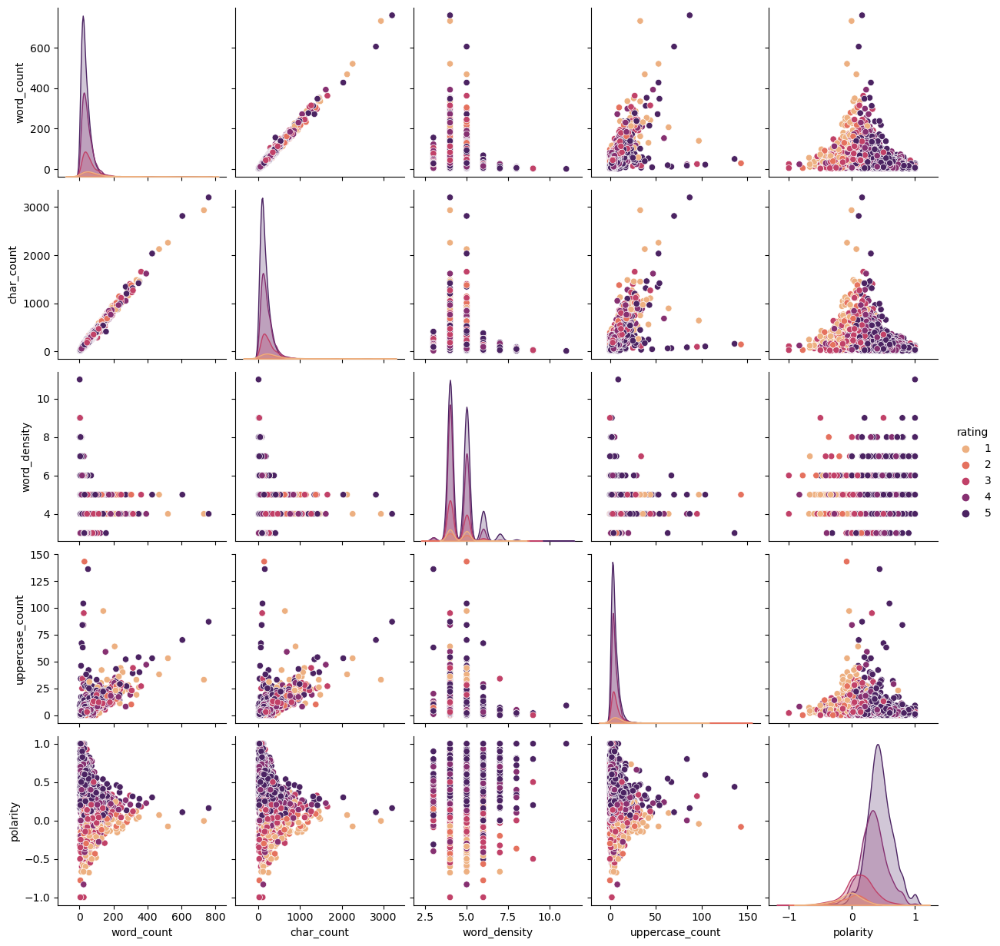

In [45]:
# quick pairplot to visualise relationship

sns.pairplot(df, hue='rating', palette='flare')

- Strong positive linear relationship between word count and character count
    - This will be checked in the correlation matrix
- polarity shows different distribution by each rating
- Few outliers in word count and character count

In [175]:
def plot_feature_by_rating(feature, category):
    # Create a figure with a 2x2 grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))

    # Plot the first plot in the top left subplot
    sns.barplot(data=df, x=category, y=feature, palette='flare', ax=axs[0][0])
    
    # Plot the second plot in the top right subplot
    sns.kdeplot(data=df, x=feature, hue=category, palette='flare', fill=True, ax=axs[0][1])

    # Plot the third plot in the bottom left subplot
    sns.boxplot(data=df, x=category, y=feature, palette='flare', ax=axs[1][0])
    
    # Plot the fourth plot in the bottom right subplot
    sns.violinplot(data=df, x=category, y=feature, palette='flare', alpha=0.3, ax=axs[1][1])
#     sns.stripplot(data=df, x=category, y=feature, palette='flare', alpha=0.3, ax=axs[1][1])
    
    # set title
    fig.suptitle('Plots of {} by {}'.format(feature, category), fontsize=15)
    fig.subplots_adjust(top=0.93)
    
    # Show the plot
    plt.show()

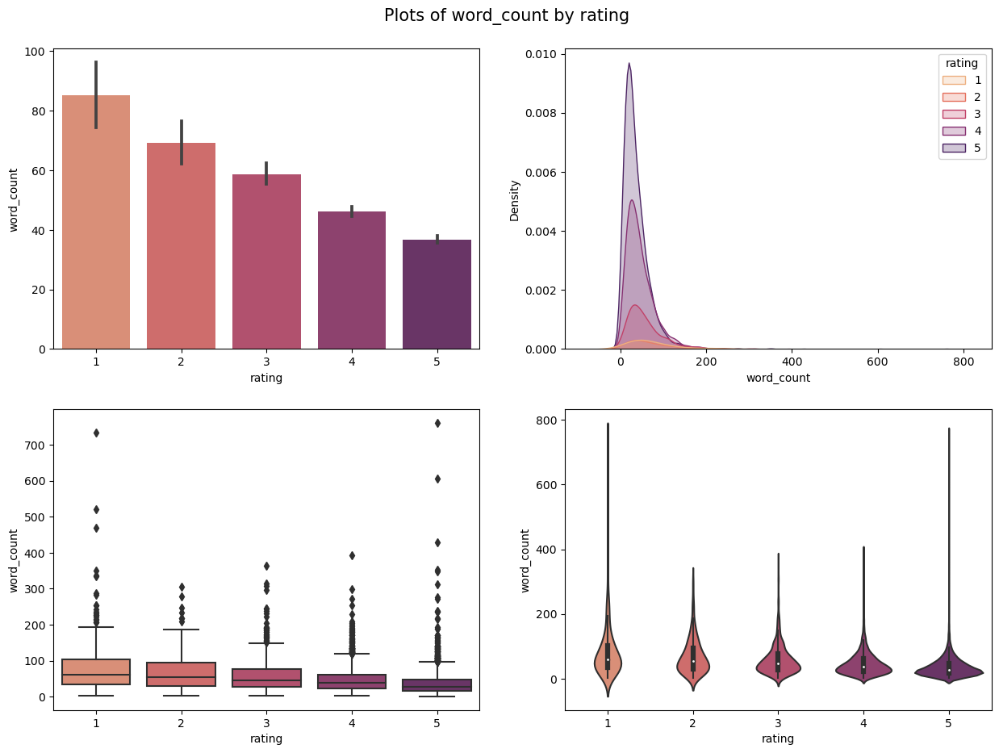

In [176]:
plot_feature_by_rating('word_count', 'rating')

- Number of words in a review tends to increase with decreasing rating, with more spread in lower ratings.  
- There are some notable outliers for rating 1 and 5.

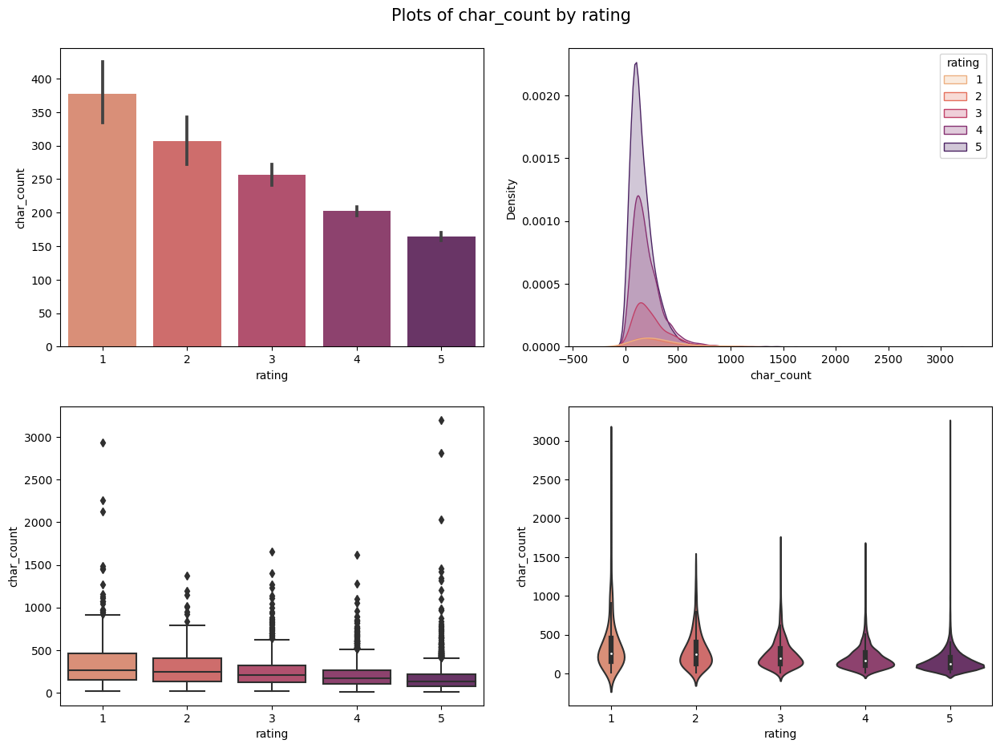

In [177]:
plot_feature_by_rating('char_count', 'rating')

Very similar observations for character count, with word count.

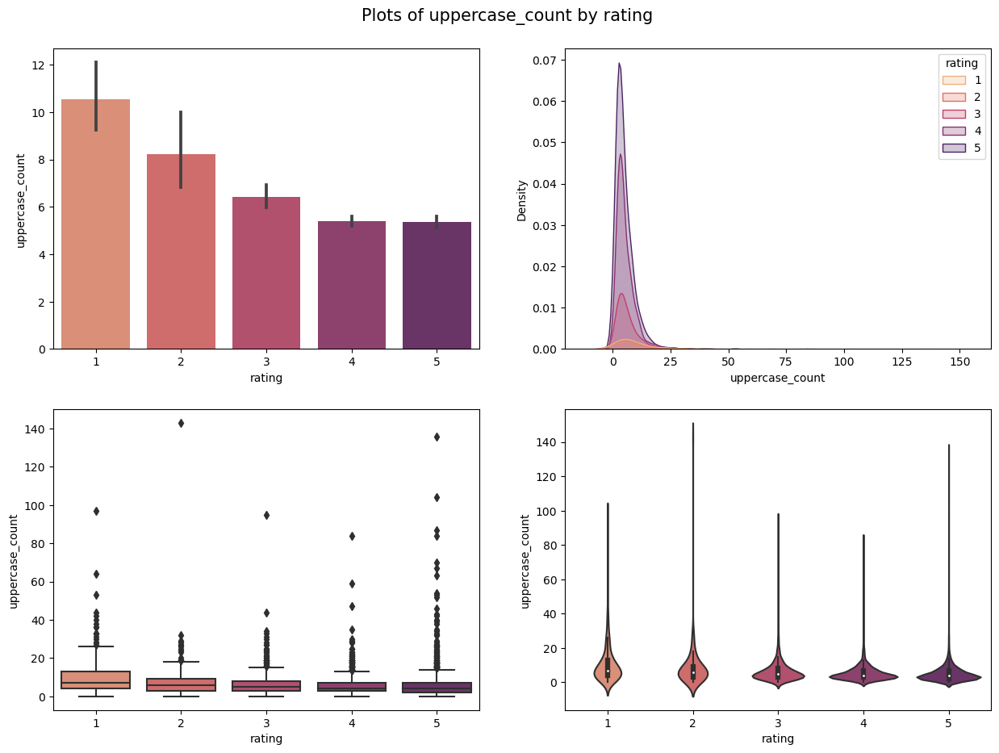

In [178]:
plot_feature_by_rating('uppercase_count', 'rating')

- Number of words in a review tends to increase with decreasing rating, with more spread in lower ratings.  
- There is an outlier with over 700 words in reviews rated 1.

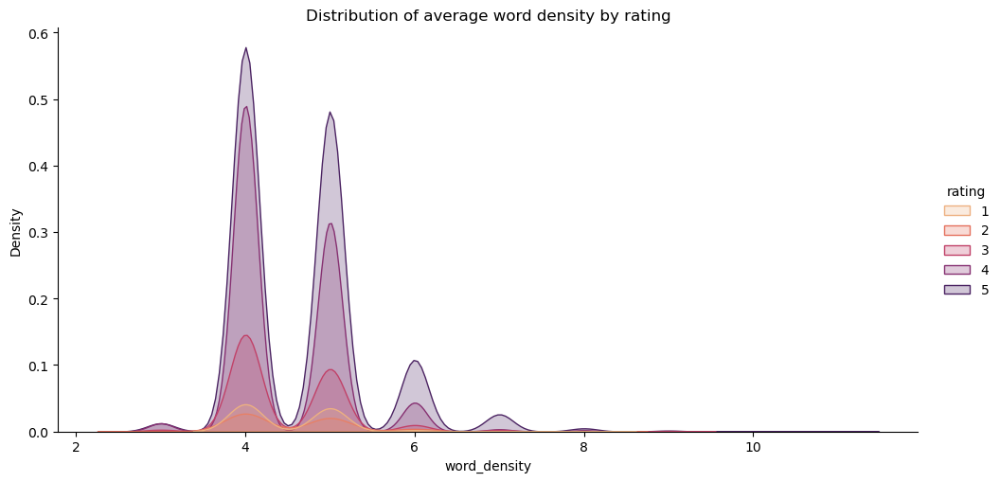

In [181]:
sns.displot(data=df, x='word_density', hue='rating', palette='flare', kind='kde', fill=True, aspect=2)
plt.title('Distribution of average word density by rating')
plt.show()

All ratings appear to have similar distribution for word density.

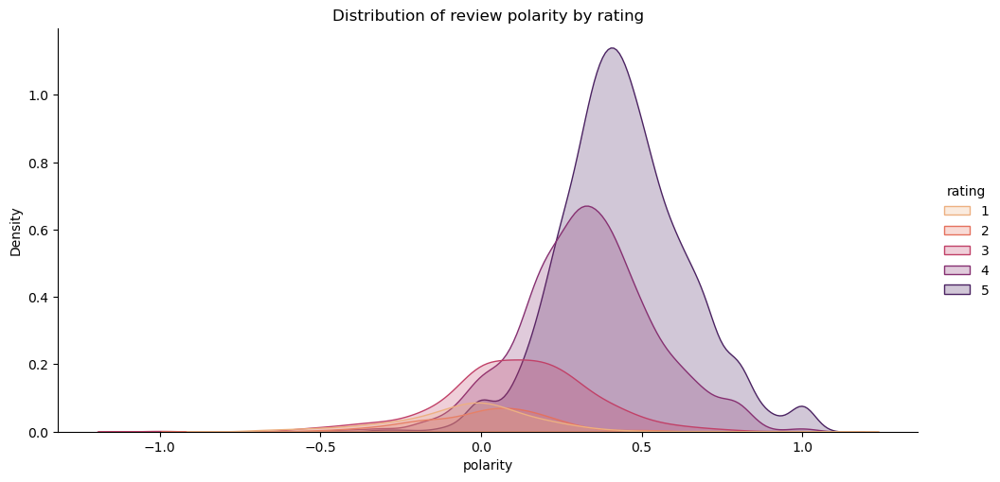

In [182]:
sns.displot(data=df, x='polarity', hue='rating', palette='flare', kind='kde', fill=True, aspect=2)
plt.title('Distribution of review polarity by rating')
plt.show()

In [400]:
df[df['polarity'] < -0.7]

,title,body,date,rating,review,review_clean,word_count,char_count,word_density,uppercase_count,polarity,sentiment
1986,the produce is very disappointing.,NaN,2022-05-30 06:33:55+00:00,2,the produce is very disappointing.,produce disappointing,5,30,6.0,0,-0.780000,0
2646,I think HelloFresh foods and recipes…,I think HelloFresh foods and recipes are great...,2022-04-20 03:00:52.117000+00:00,4,I think HelloFresh foods and recipes… I think ...,think hellofresh food recipe think hellofresh ...,24,123,5.0,8,-0.833333,1


Interestingly, reviews with ratings 1~3 have similar distribution for polarity. They peak around 0, which is a 'neutral' sentiment by definition.

The reviews with rating 4 or 5 have mostly positive polarity, but not entirely. 

So polarity can suggest whether a review is positve or negative, but doesn't give the full picture.

### Map rating to sentiment

For this project, I will be predicting whether a review is positive or negative. For simplicity, reviews with rating 3 have been excluded.

- Rating 4~5 = 1 (positive)
- Rating 1~2 = 0 (negative)

In [188]:
# back up before making changes
df_backup2 = df.copy()

In [190]:
df = df[df['rating'] != 3]

In [193]:
rating_map = {1: 0, 2: 0, 4: 1, 5: 1}

df['sentiment'] = df['rating'].map(rating_map)

/var/folders/73/ztkfnzcd6ml3x4nhm20222mc0000gn/T/ipykernel_77806/3966751501.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [194]:
df['sentiment'].value_counts(normalize=True)*100

1    91.692668
0     8.307332
Name: sentiment, dtype: float64

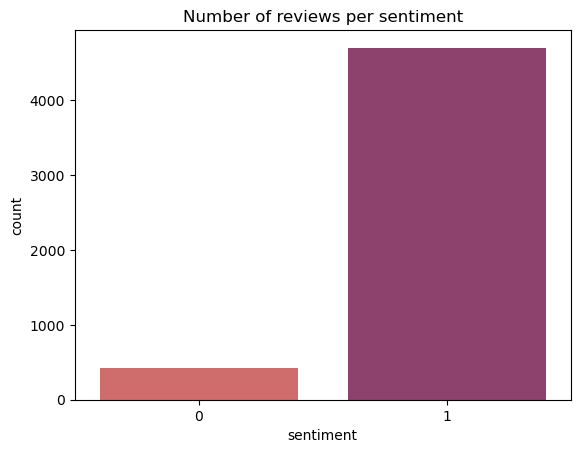

In [195]:
_= sns.countplot(data=df, x='sentiment', palette='flare').set_title('Number of reviews per sentiment')

In [196]:
df.groupby('sentiment').mean().round(2)

,rating,word_count,char_count,word_density,uppercase_count,polarity
sentiment,,,,,,
0,1.45,77.99,346.18,4.54,9.51,-0.02
1,4.61,40.42,178.92,4.58,5.37,0.40


As we observed in previous analysis, negative reviews have more words, characters and uppercase words on average.  Word density is similar for both sentiment.

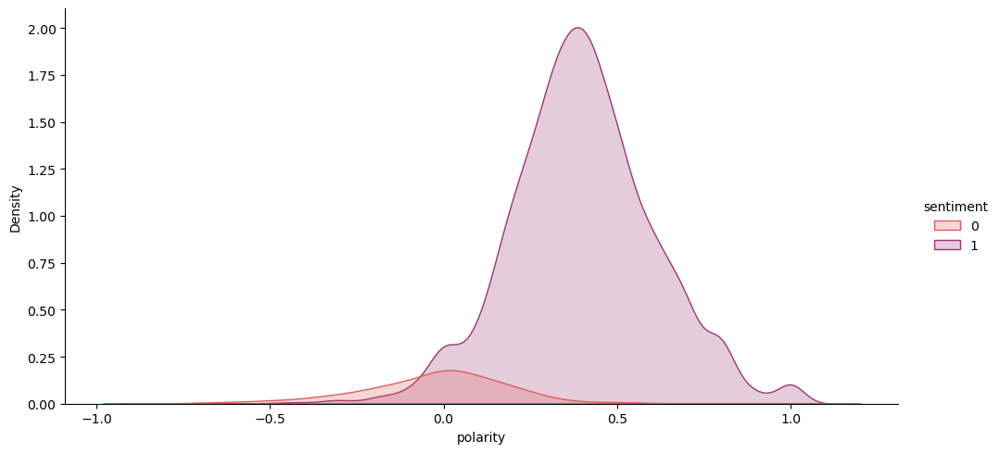

In [198]:
_= sns.displot(data=df, x='polarity', hue='sentiment', palette='flare', kind='kde', fill=True, aspect=2)

Distribution for polarity (text sentiment) is distinct for each sentiment. For negative reviews, the peak is around 0, which suggests negative sentiment could be more neutral or subtle?

## Word Cloud

Word clouds are useful visualisation to see which words are being frequently used. We will generate separate word clouds for positive and negative reviews.

In [251]:
# this function generates a word cloud from reviews with a given sentiment.

def generate_word_cloud(sentiment=None):
    
    if sentiment in [0, 1]:
        reviews = df[df['sentiment'] == sentiment]['review_clean']
        
    else:
        reviews = df['review_clean']
    
    words = ' '.join(reviews)
    
    # exclude these words since this is related to company name
    stop = ['hello', 'fresh', 'hellofresh']
    
    wordcloud = WordCloud(background_color='white', width=1200, height=600, random_state=20, stopwords=stop).generate(words)
    fig = plt.figure(
        figsize = (40, 20),
        facecolor = 'k',
        edgecolor = 'k')
    
    # Plot the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

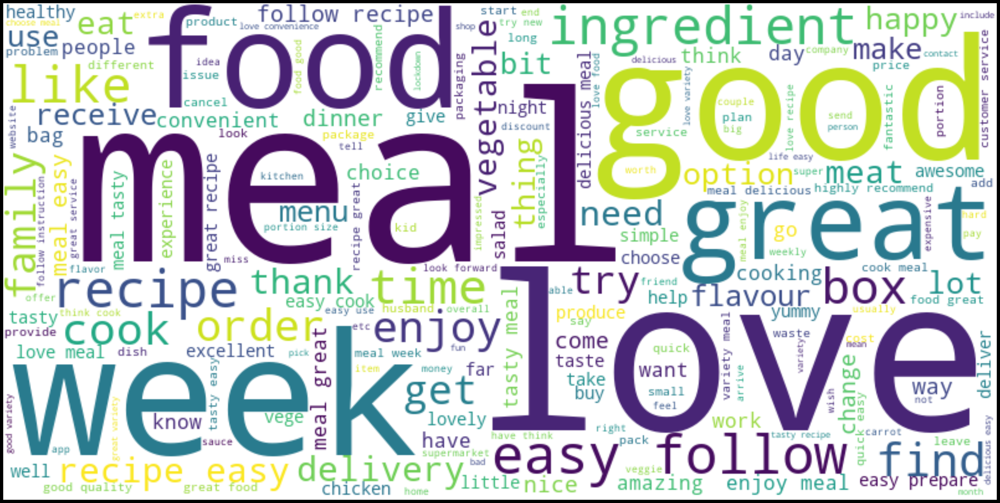

In [200]:
# total word cloud
generate_word_cloud()

Overall it looks positive, which is aligned with the dataset having mostly positive reviews.

Generate a word cloud for positive reviews only.

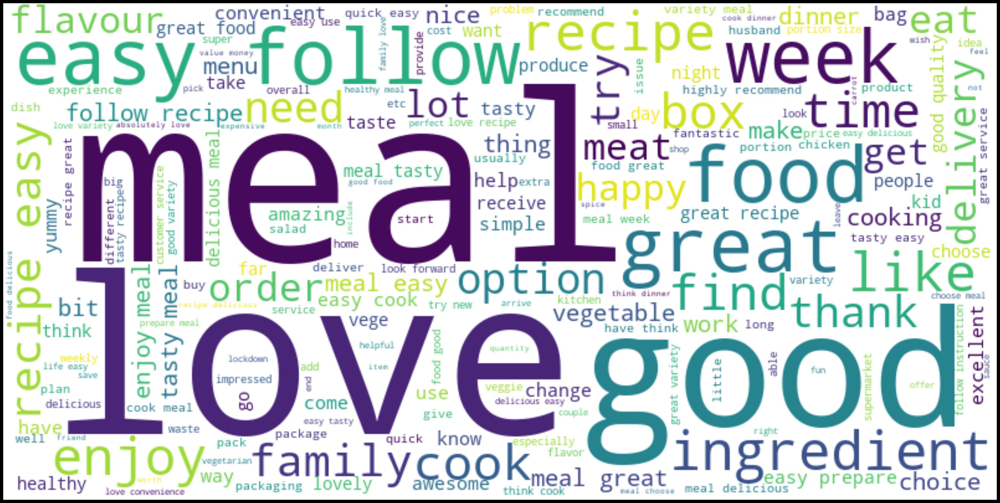

In [201]:
generate_word_cloud(sentiment=1)

There are many obviously positive words (e.g. love, great, good, easy, enjoy) that pop out. Similar to total word cloud.

Now look at word cloud for negative reviews.

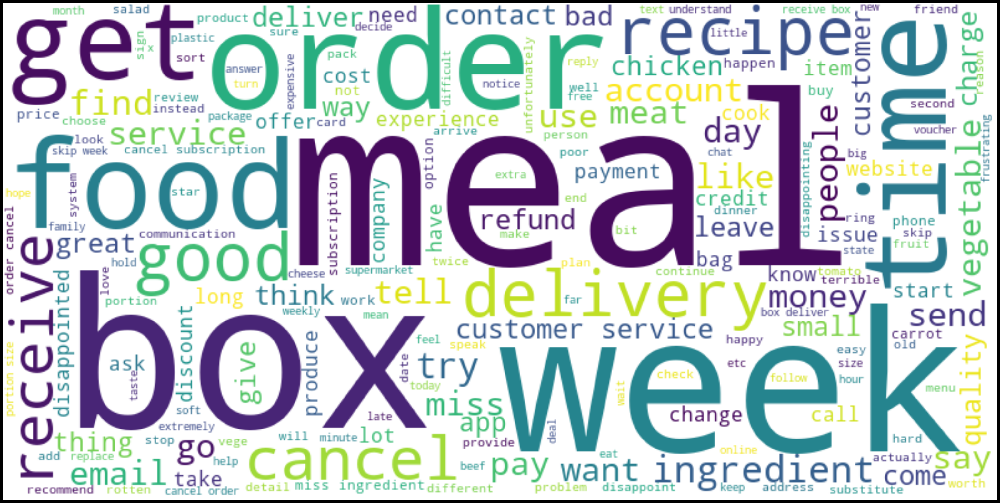

In [202]:
generate_word_cloud(sentiment=0)

 Words that pop out are mostly nouns (e.g. food, time, box, meal, week, delivery). Compared with the positive word cloud, there are fewer obviously negative words (e.g. cancel, bad).
 
This may be because when people write negative reviews, they are usually about specific things.

In [64]:
def plot_top_ngrams(sentiment, n_grams, n_words, title):
    
    # subset of dataframe by sentiment
    reviews = df[df['sentiment'] == sentiment]['review_clean']
    
    # Check if we want to plot the frequency of words or bigrams
    if n_grams == 1:
        # Get a list of all the words in the reviews
        all_ngrams = [word for review in reviews for word in review.split()]
        
    elif n_grams == 2:
        # split each review into individual words
        all_ngrams = [review.split() for review in reviews]
        
        # for each review, zip individual words and next words into bigram
        all_ngrams = [bigram for bigram_list in all_ngrams for bigram in zip(bigram_list, bigram_list[1:])]

    # Count the frequency of each word or bigram
    ngram_counts = Counter(all_ngrams)

    # Get the most common word or bigram
    most_common_ngrams = ngram_counts.most_common(n_words)

    # get ngram and frequency
    ngrams = [' '.join(ngram) if n_grams == 2 else ngram for ngram, count in most_common_ngrams]
    counts = [count for ngram, count in most_common_ngrams]

    # Plot the frequency of the top n_words n-grams
    plt.figure(figsize = (16, 6))
    if sentiment == 0:
        plt.bar(ngrams, counts, color='indianred')
    elif sentiment == 1:
        plt.bar(ngrams, counts, color='teal')
    plt.ylabel('Frequency')
    plt.title(title)
    plt.xticks(rotation=90, fontsize=12)
    plt.show()

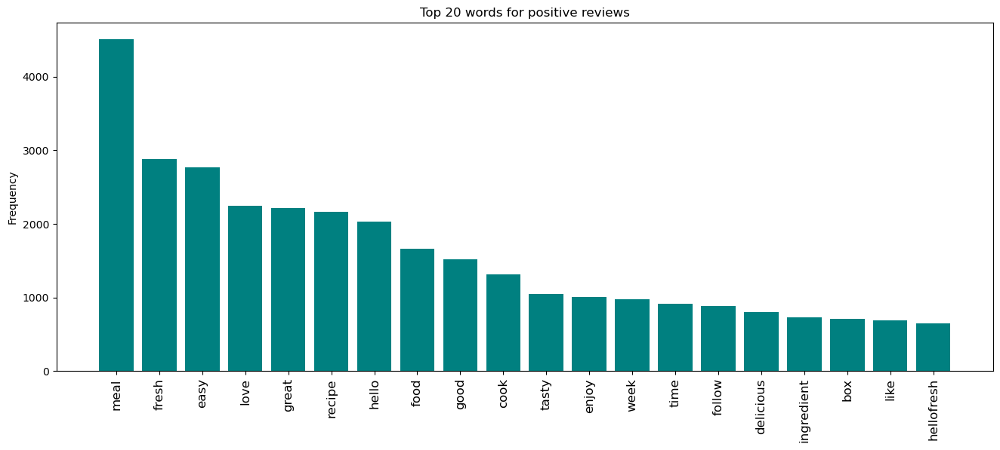

In [203]:
plot_top_ngrams(sentiment=1, n_grams=1, n_words=20, title='Top 20 words for positive reviews')

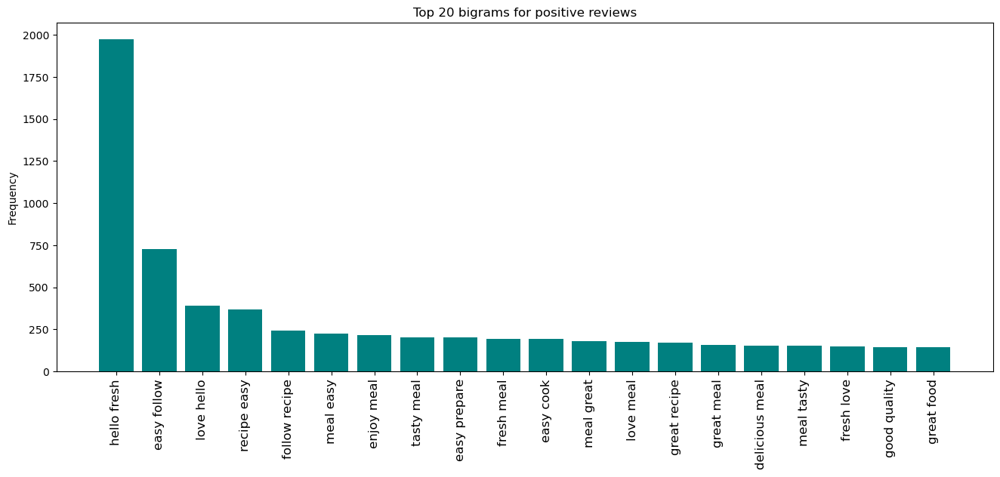

In [204]:
plot_top_ngrams(sentiment=1, n_grams=2, n_words=20, title='Top 20 bigrams for positive reviews')

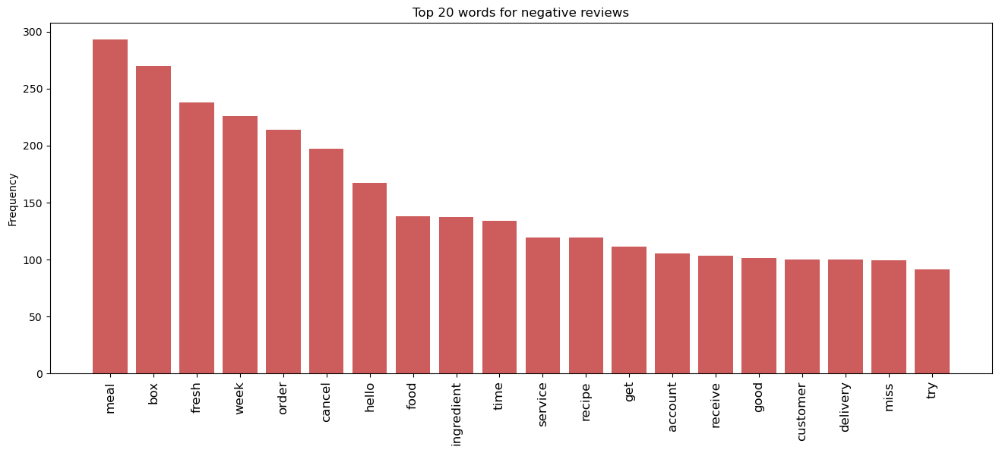

In [205]:
plot_top_ngrams(sentiment=0, n_grams=1, n_words=20, title='Top 20 words for negative reviews')

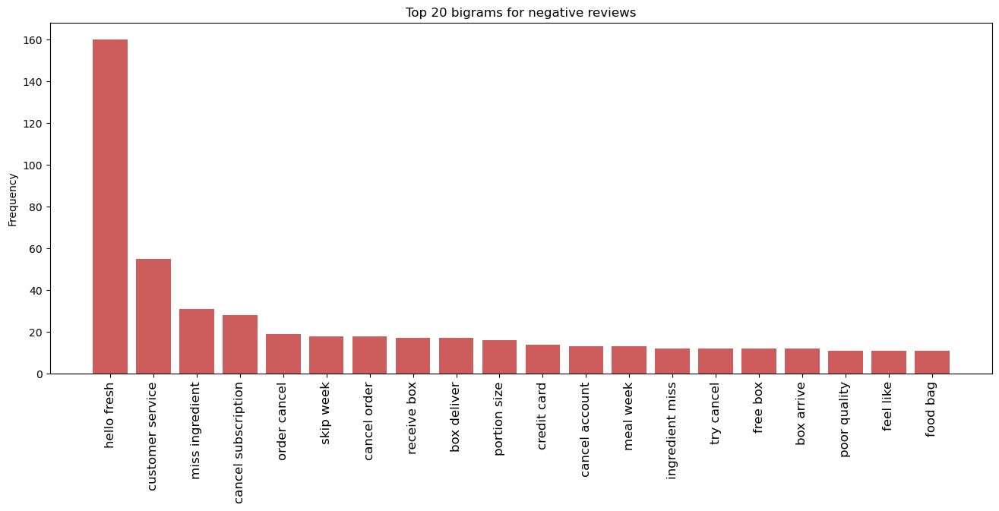

In [206]:
plot_top_ngrams(sentiment=0, n_grams=2, n_words=20, title='Top 20 bigrams for negative reviews')

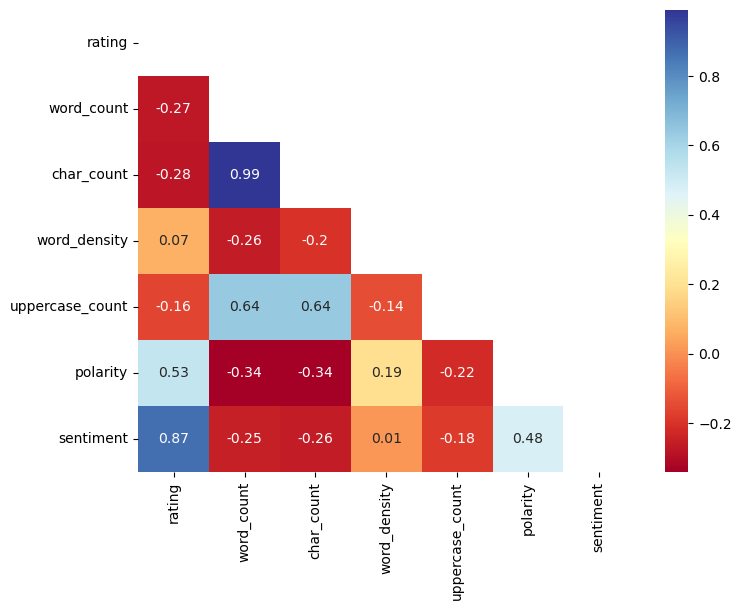

In [207]:
# check correlation matrix

corr = df.corr().round(2)
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(8,6)) 
ax = sns.heatmap(corr, mask=mask, cmap='RdYlBu', annot=True)

Word count and character count has correlation of 0.99. This is reasonable as number of words increase, the number of characters must increase.

We can confirm this with a scatter plot.

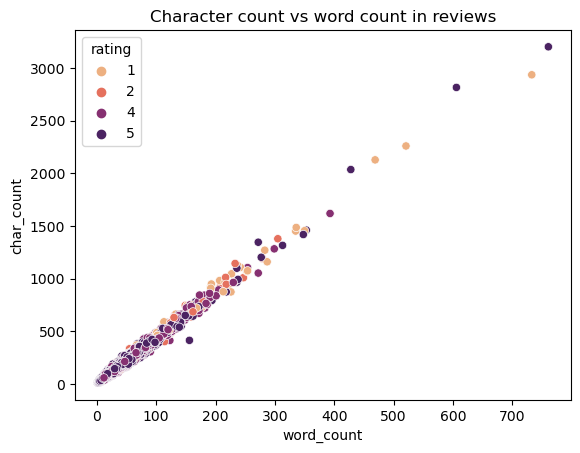

In [208]:
# check scatter plot of word count and character count

_= sns.scatterplot(data=df, x='word_count', y='char_count', hue='rating', palette='flare').set_title('Character count vs word count in reviews')


# Modelling

Try
- Logistic Regression
- Multinomial NB
- SVC
- Random forest
- Boosting

In [346]:
# This function takes the best grid and test data as input
# outputs confusion matrix, fpr/tpr/auc

def fit_evaluate_model(clf, X_train, y_train, X_test, y_test):
    
    # fit model
    clf.fit(X_train, y_train)
    
    print('Train score: %.4f' % clf.score(X_train, y_train))

    # predictions
    y_pred = clf.predict(X_test)
    
    # display confusion matrix as plot
    cm = confusion_matrix(y_test, y_pred)

    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Positive']).plot()
              
    # predicted probabilities
    y_ppr = clf.predict_proba(X_test)

    print('Test score: %.4f\n' % accuracy_score(y_test, y_pred))
    
    # display classification report
    print(classification_report(y_test, y_pred))
    
    return clf
    

In [382]:
# helper function to show results and charts
def show_summary_report(clf, actual, X_test):
    
    prediction = clf.predict(X_test)
    
    # get the minority class (0) probabilities - for PR 
    probabilities = clf.predict_proba(X_test)[:,0]
    
    # majority class probabilities - for ROC
    probabilities_major = clf.predict_proba(X_test)[:,1]

    # Confusion Matrix
    mat = confusion_matrix(actual, prediction)

    # Precision/Recall
    precision, recall, _ = precision_recall_curve(actual, probabilities, pos_label=0)
    average_precision = average_precision_score(actual, probabilities)
    
    # Compute ROC curve and ROC area
    fpr, tpr, _ = roc_curve(actual, probabilities_major)
    roc_auc = auc(fpr, tpr)

    # plot
    fig, ax = plt.subplots(1, 3, figsize = (18, 6))
#     fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

    # Confusion Matrix
    sns.heatmap(mat, square = True, annot = True, fmt = 'd', cbar = False, cmap = 'Blues', ax = ax[0])

    ax[0].set_title('Confusion Matrix')
    ax[0].set_xlabel('Predicted label')
    ax[0].set_ylabel('True label')
    
    # Precision/Recall
    step_kwargs = {'step': 'post'}
    ax[1].step(recall, precision, color = 'b', alpha = 0.2, where = 'post')
    ax[1].fill_between(recall, precision, alpha = 0.2, color = 'b', **step_kwargs)
    ax[1].set_ylim([0.0, 1.0])
    ax[1].set_xlim([0.0, 1.0])
    ax[1].set_xlabel('Recall')
    ax[1].set_ylabel('Precision')
    ax[1].set_title('Precision-Recall curve (Negative class)')
    
    # ROC
    ax[2].plot(fpr, tpr, color = 'darkorange', lw = 2, label = 'ROC curve (AUC = %0.2f)' % roc_auc)
    ax[2].plot([0, 1], [0, 1], color = 'navy', lw = 2, linestyle = '--')
    ax[2].set_xlim([0.0, 1.0])
    ax[2].set_ylim([0.0, 1.0])
    ax[2].set_xlabel('False Positive Rate')
    ax[2].set_ylabel('True Positive Rate')
    ax[2].set_title('Receiver Operating Characteristic')
    ax[2].legend(loc = 'lower right')

    plt.show()
    

In [209]:
## split the dataset
X = df['review_clean']
y = df['sentiment']

#split into train test
X_train, X_test, y_train,  y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Extract numerical feature vectors from pre-processed collection of text using:
- Count vectorizer: convert into a matrix of token counts
- TF-IDF: convert matrix of Tf-idf features

In [72]:
# create a CountVectorizer object
count_vect = CountVectorizer(max_features=500)

# Fit and transform train data
X_train_count = count_vect.fit_transform(X_train)

# Transform test data into feature vectors
X_test_count = count_vect.transform(X_test)

In [210]:
# create word level TFIDF object
tfidf_vect = TfidfVectorizer(max_features=500)

# Fit and transform train data
X_train_tfidf = tfidf_vect.fit_transform(X_train)

# Transform test data into feature vectors
X_test_tfidf  = tfidf_vect.transform(X_test)

## Baseline Models

As a baseline, we will try fit the following models without hyperparameter tuning and evaluate their performance.

In [117]:
logreg = LogisticRegression(max_iter=10000)
svc = SVC(probability=True)
nb = MultinomialNB()
rf = RandomForestClassifier()
gb = GradientBoostingClassifier()

## Logistic Regression

Train score: 0.9844
Test score: 0.9571

              precision    recall  f1-score   support

           0       0.77      0.68      0.72        85
           1       0.97      0.98      0.98       941

    accuracy                           0.96      1026
   macro avg       0.87      0.83      0.85      1026
weighted avg       0.96      0.96      0.96      1026



LogisticRegression(max_iter=10000)

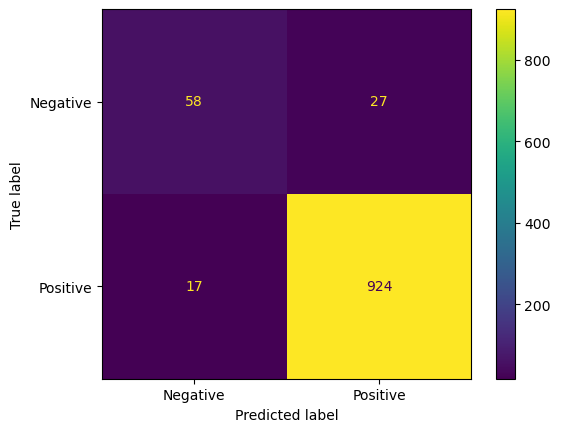

In [347]:
# count vectorizer
fit_evaluate_model(logreg, X_train_count, y_train, X_test_count, y_test)

For class 0 (negative):   
precision = 0.77  
recall = 0.68  
f1-score = 0.72  

Train score: 0.9600
Test score: 0.9561

              precision    recall  f1-score   support

           0       0.88      0.54      0.67        85
           1       0.96      0.99      0.98       941

    accuracy                           0.96      1026
   macro avg       0.92      0.77      0.82      1026
weighted avg       0.95      0.96      0.95      1026



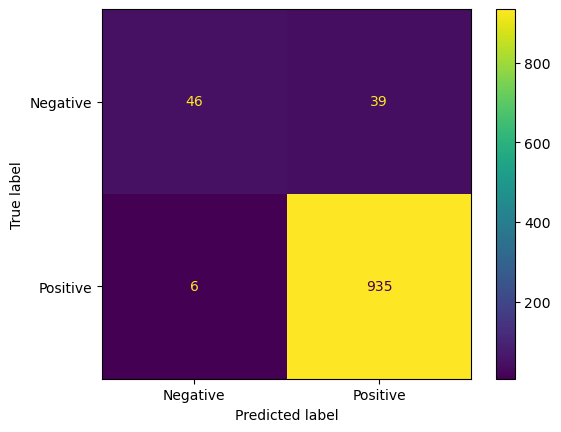

In [228]:
# TF-IDF
fit_evaluate_model(logreg, X_train_tfidf, y_train, X_test_tfidf, y_test)

For class 0 (negative):   
precision = 0.88  
recall = 0.54  
f1-score = 0.67  

## Naive Bayes

Train score: 0.9537
Test score: 0.9444

              precision    recall  f1-score   support

           0       0.63      0.78      0.70        85
           1       0.98      0.96      0.97       941

    accuracy                           0.94      1026
   macro avg       0.81      0.87      0.83      1026
weighted avg       0.95      0.94      0.95      1026



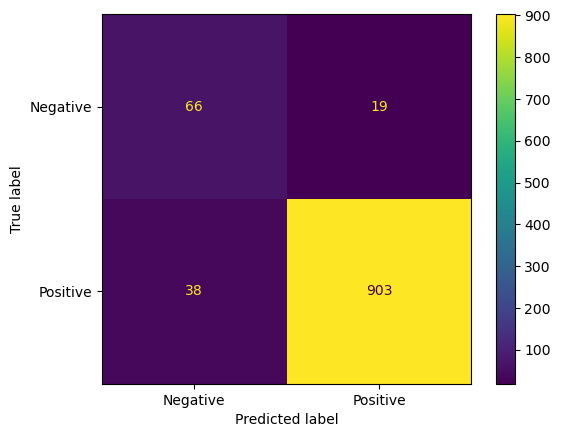

In [253]:
# count vectorizer
fit_evaluate_model(nb, X_train_count, y_train, X_test_count, y_test)

For class 0 (negative):   
precision = 0.63  
recall = 0.78  
f1-score = 0.70    

Compared with logistic regression baseline, precision is lower but recall is higher. Overall, f1-score is slightly lower.

Train score: 0.9534
Test score: 0.9464

              precision    recall  f1-score   support

           0       0.86      0.42      0.57        85
           1       0.95      0.99      0.97       941

    accuracy                           0.95      1026
   macro avg       0.90      0.71      0.77      1026
weighted avg       0.94      0.95      0.94      1026



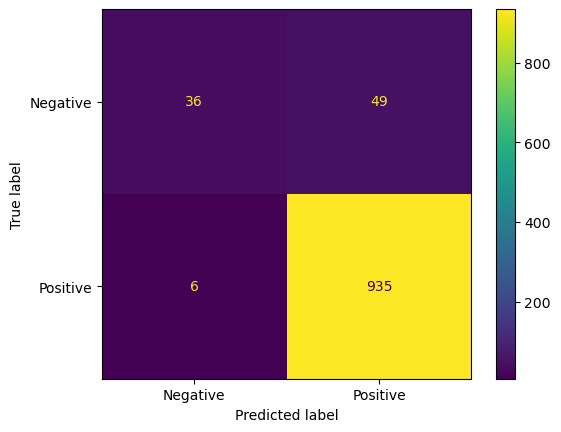

In [255]:
fit_evaluate_model(nb, X_train_tfidf, y_train, X_test_tfidf, y_test)

For class 0 (negative):   
precision = 0.86  
recall = 0.42  
f1-score = 0.57    

Did not do so well in detecting true negatives.

## SVM

Train score: 0.9815
Test score: 0.9464

              precision    recall  f1-score   support

           0       0.88      0.41      0.56        85
           1       0.95      0.99      0.97       941

    accuracy                           0.95      1026
   macro avg       0.91      0.70      0.77      1026
weighted avg       0.94      0.95      0.94      1026



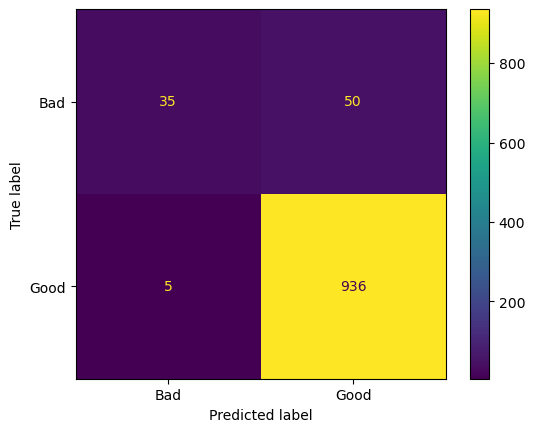

In [92]:
# count vectorizer
fit_evaluate_model(svc, X_train_count, y_train, X_test_count, y_test)

For class 0 (negative):   
precision = 0.88    
recall = 0.41   
f1-score = 0.56   

Precision is high but low recall drags the f1 score down.

Train score: 0.9876
Test score: 0.9532

              precision    recall  f1-score   support

           0       0.85      0.53      0.65        85
           1       0.96      0.99      0.97       941

    accuracy                           0.95      1026
   macro avg       0.90      0.76      0.81      1026
weighted avg       0.95      0.95      0.95      1026



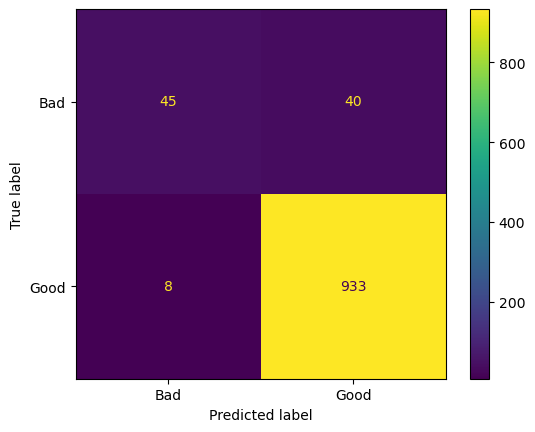

In [93]:
fit_evaluate_model(svc, X_train_tfidf, y_train, X_test_tfidf, y_test)

For class 0 (negative):   
precision = 0.85    
recall = 0.53   
f1-score = 0.65   

f1 score is higher than the count vectorizer SVM baseline model

## Random Forest

Train score: 0.9995
Test score: 0.9513

              precision    recall  f1-score   support

           0       0.83      0.52      0.64        85
           1       0.96      0.99      0.97       941

    accuracy                           0.95      1026
   macro avg       0.89      0.75      0.81      1026
weighted avg       0.95      0.95      0.95      1026



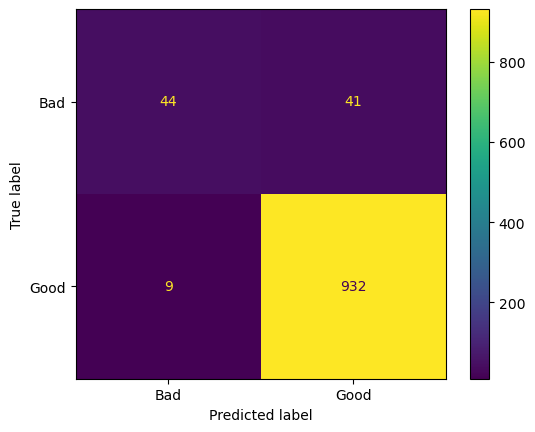

In [98]:
# count vectorizer
fit_evaluate_model(rf, X_train_count, y_train, X_test_count, y_test)

For class 0 (negative):   
precision = 0.83   
recall = 0.52   
f1-score = 0.64   

Did not do so well in detecting true negatives.

Train score: 0.9993
Test score: 0.9474

              precision    recall  f1-score   support

           0       0.84      0.45      0.58        85
           1       0.95      0.99      0.97       941

    accuracy                           0.95      1026
   macro avg       0.90      0.72      0.78      1026
weighted avg       0.94      0.95      0.94      1026



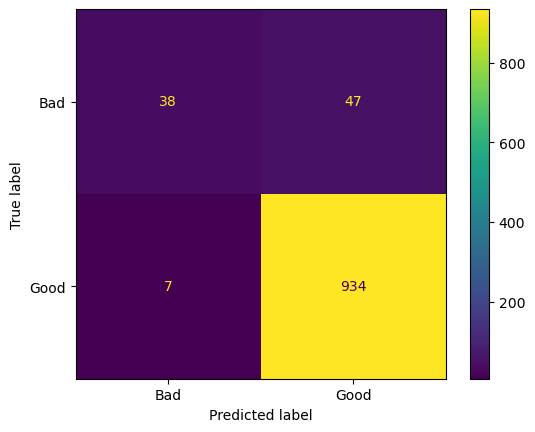

In [99]:
fit_evaluate_model(rf, X_train_tfidf, y_train, X_test_tfidf, y_test)

For class 0 (negative):   
precision = 0.84   
recall = 0.45   
f1-score = 0.58   

Again, does not do well in detecting true negatives.

## Gradient Boosting

Train score: 0.9651
Test score: 0.9474

              precision    recall  f1-score   support

           0       0.84      0.45      0.58        85
           1       0.95      0.99      0.97       941

    accuracy                           0.95      1026
   macro avg       0.90      0.72      0.78      1026
weighted avg       0.94      0.95      0.94      1026



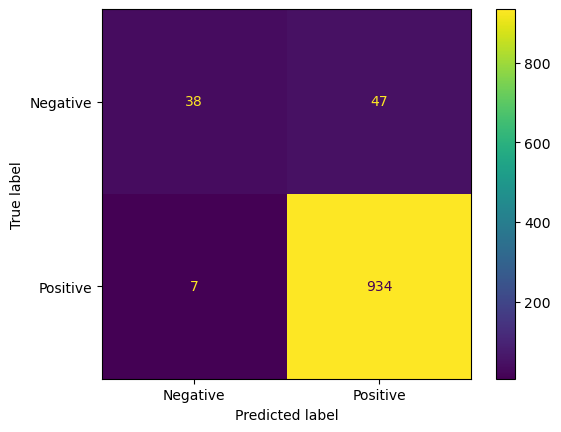

In [260]:
# count vectorizer
fit_evaluate_model(gb, X_train_count, y_train, X_test_count, y_test)

For class 0 (negative):   
precision = 0.83   
recall = 0.46   
f1-score = 0.59   

Similar to the random forest, gradient boosting does not do well in identifying true negatives.

Train score: 0.9664
Test score: 0.9493

              precision    recall  f1-score   support

           0       0.88      0.45      0.59        85
           1       0.95      0.99      0.97       941

    accuracy                           0.95      1026
   macro avg       0.92      0.72      0.78      1026
weighted avg       0.95      0.95      0.94      1026



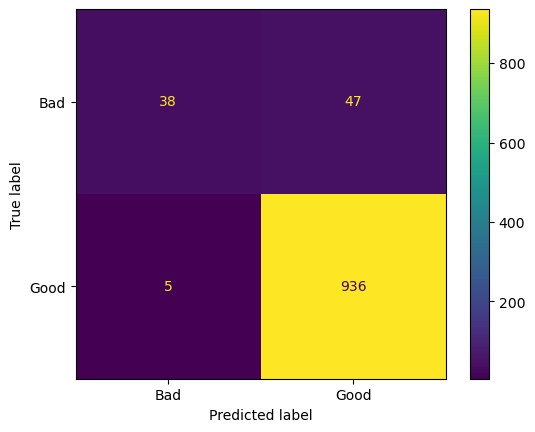

In [104]:
fit_evaluate_model(gb, X_train_tfidf, y_train, X_test_tfidf, y_test)

For class 0 (negative):   
precision = 0.88   
recall = 0.45   
f1-score = 0.59   

Almost identical results here, from the baseline count vectorizer gradient boosting model.

## Hyperparameter Tuning

From the performance of the baseline models, logistic regression and naive bayes models have performed the best. 

We will try tuning the hyperparameters of the two models to improve the performance.

### Logistic Regression

In [300]:
params =  {'solver': ['liblinear'],
           'C': [0.1, 1, 10], 
           'penalty': ['l1', 'l2']}
# {'solver': ['lbfgs', 'sag', 'saga'],
#           'C': np.logspace(-4, 4, 50),
#            'penalty': ['l2']
#           }
# {'solver':['lbfgs','liblinear'],'C': [0.1, 1, 10], 'penalty': ['l1', 'l2']}

Train score: 0.9884
Test score: 0.9581

              precision    recall  f1-score   support

           0       0.78      0.69      0.73        85
           1       0.97      0.98      0.98       941

    accuracy                           0.96      1026
   macro avg       0.87      0.84      0.86      1026
weighted avg       0.96      0.96      0.96      1026



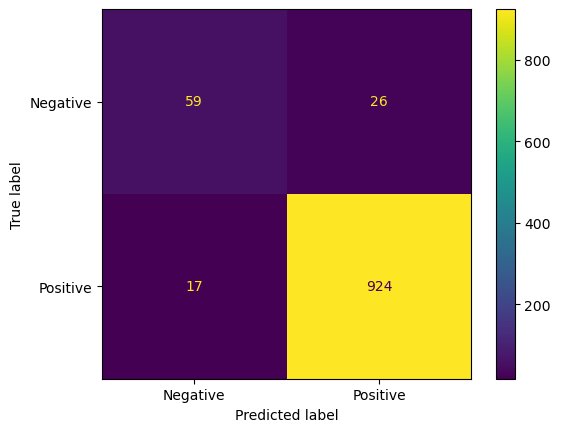

In [304]:
grid_log = GridSearchCV(logreg, param_grid=params, cv=5, n_jobs=-1, scoring='f1')

grid_log_count = fit_evaluate_model(grid_log, X_train_count, y_train, X_test_count, y_test)

After tuning, f1-score for negative class increased slightly 0.73 (baseline = 0.72).

The tuned model correctly classified 1 more negative review

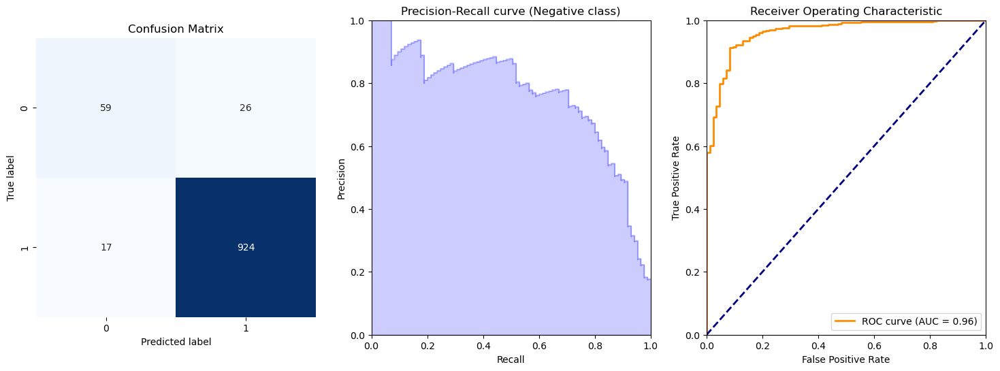

In [370]:
show_summary_report(grid_log_count, y_test, X_test_count)

Train score: 0.9906
Test score: 0.9552

              precision    recall  f1-score   support

           0       0.75      0.68      0.72        85
           1       0.97      0.98      0.98       941

    accuracy                           0.96      1026
   macro avg       0.86      0.83      0.85      1026
weighted avg       0.95      0.96      0.95      1026



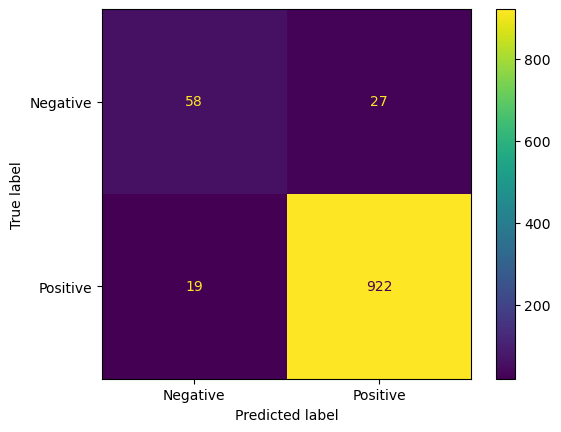

In [305]:
grid_log = GridSearchCV(logreg, param_grid=params, cv=5, n_jobs=-1, scoring='f1')

grid_log_tfidf =fit_evaluate_model(grid_log, X_train_tfidf, y_train, X_test_tfidf, y_test)

Almost identical performance to the tuned count vectorizer model. F1-score is slightly lower.

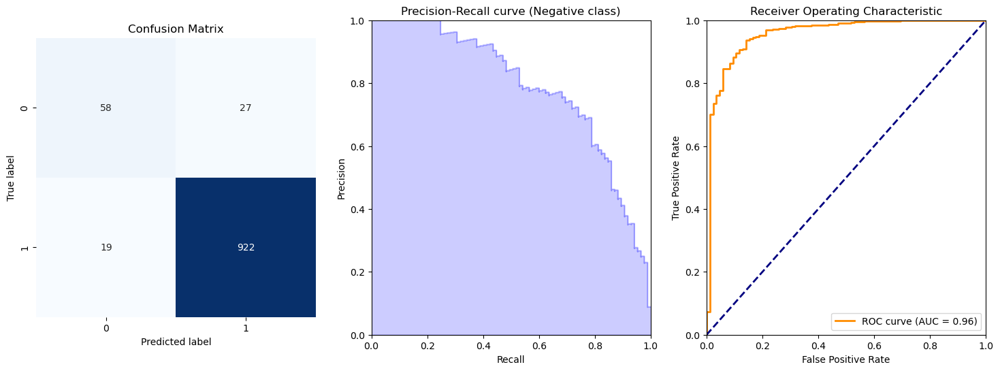

In [371]:
show_summary_report(grid_log_tfidf, y_test, X_test_tfidf)

### Naive Bayes

In [394]:
# try class_prior with the imbalanced probabilities

params = {'alpha': [0.01, 0.1, 1.0, 10.0],
              'fit_prior': [True, False],
              'class_prior': [None, [0.1, 0.9], [0.2, 0.8]]}

In [393]:
grid_nb_count.best_estimator_

MultinomialNB(alpha=10.0)

Train score: 0.9743
Test score: 0.9425

              precision    recall  f1-score   support

           0       0.64      0.71      0.67        85
           1       0.97      0.96      0.97       941

    accuracy                           0.94      1026
   macro avg       0.81      0.83      0.82      1026
weighted avg       0.95      0.94      0.94      1026



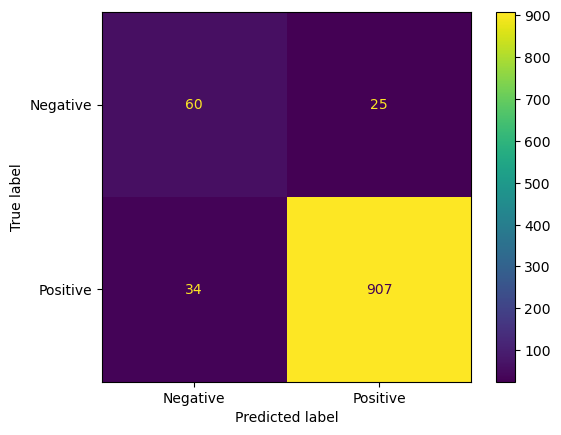

In [396]:
grid_nb = GridSearchCV(nb, param_grid=params, cv=5, n_jobs=-1, scoring='f1')

grid_nb_count = fit_evaluate_model(grid_nb, X_train_count, y_train, X_test_count, y_test)

For class 0 (negative):   
precision = 0.64      
recall = 0.71  
f1-score = 0.67    

Scores got lower with parameter tuning?

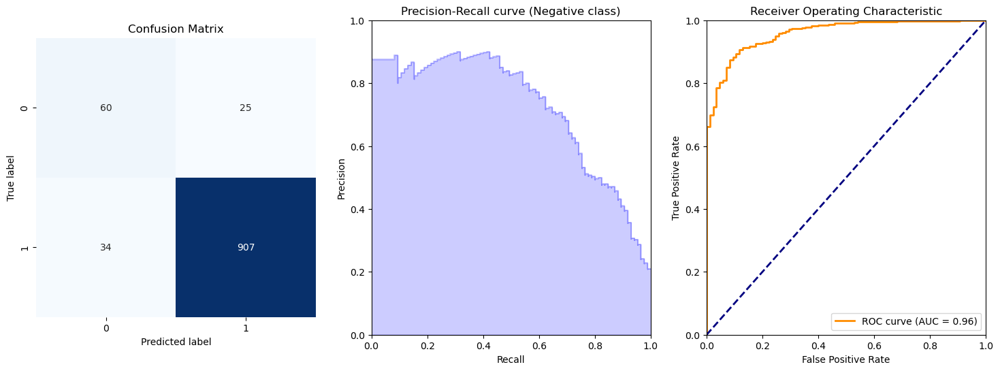

In [372]:
show_summary_report(grid_nb_count, y_test, X_test_count)

Train score: 0.9791
Test score: 0.9522

              precision    recall  f1-score   support

           0       0.73      0.67      0.70        85
           1       0.97      0.98      0.97       941

    accuracy                           0.95      1026
   macro avg       0.85      0.82      0.84      1026
weighted avg       0.95      0.95      0.95      1026



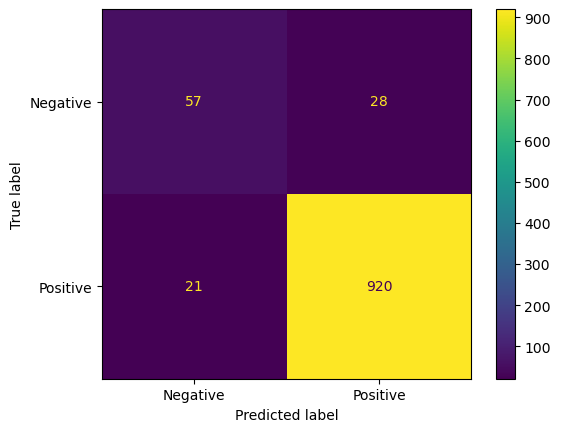

In [390]:
grid_nb = GridSearchCV(nb, param_grid=params, cv=5, n_jobs=-1, scoring='f1')

grid_nb_tfidf = fit_evaluate_model(grid_nb, X_train_tfidf, y_train, X_test_tfidf, y_test)

For class 0 (negative):   
precision = 0.86  
recall = 0.49  
f1-score = 0.63    

Recall and f1 improved slightly from baseline. But not the best.

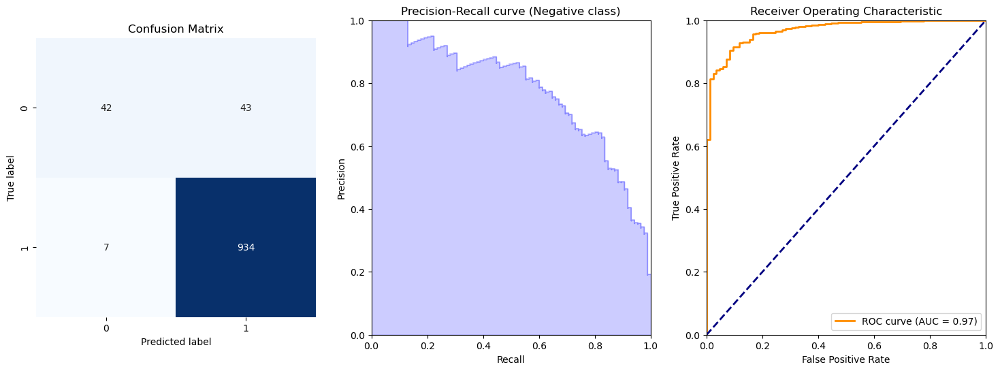

In [373]:
show_summary_report(grid_nb_tfidf, y_test, X_test_tfidf)

## Conclusion

- Logistic regression was the best model for predicting sentiment of HelloFresh reviews, with F1-score of 73% for negative review classification

- Able to identify negative reviews with a fair balance of precision and recall

- Accuracy was not considered due to class imbalance 

- Additional work should be done to resolve class imbalance - SMOTE, undersampling

- Reviews with neutral rating were excluded from scope, but could be considered as a multi class classification problem.
